# OpenCV Tutorial

In [2]:
# Loading the libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 
import os,sys,shutil,glob
import warnings
warnings.filterwarnings('ignore')

## Reading the image

- `cv2.IMREAD_COLOR`: It specifies to load a color image. Any transparency of image will be neglected. It is the default flag. Alternatively, we can pass integer value 1 for this flag.
- `cv2.IMREAD_GRAYSCALE`: It specifies to load an image in grayscale mode. Alternatively, we can pass integer value 0 for this flag.
- `cv2.IMREAD_UNCHANGED`: It specifies to load an image as such including alpha channel. Alternatively, we can pass integer value -1 for this flag.

In [3]:
# Reading an image

filename = 'image.jpg'  # Specifying the filename

filename1 = 'image1.jpeg'

image = cv2.imread(filename) # By default imread reads the in BGR format

image1 = cv2.imread(filename1)

image_rgb = cv2.cvtColor(image,cv2.COLOR_BGR2RGB) # We can convert the image into RGB format 

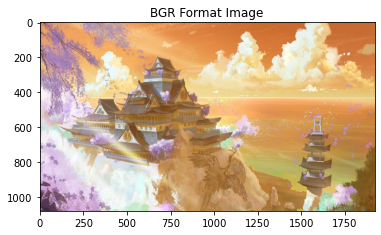

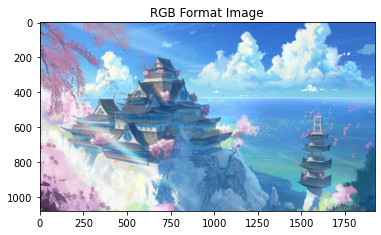

In [4]:
# Plotting the images as graphs
plt.imshow(image)
plt.title('BGR Format Image')
plt.show()
plt.imshow(image_rgb)
plt.title('RGB Format Image')
plt.show()

### RGB Channels

- Red channel - 0 
- Green channel - 1 
- Blue channel - 2

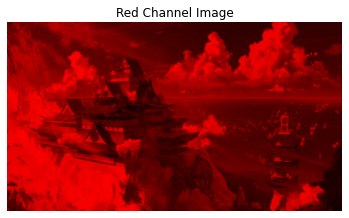

In [5]:
# Red Image channel

image = cv2.imread(filename)

image_r = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

image_r[:,:,(1,2)]=0 # Setting the other channels as 0 to get red channel image
plt.title('Red Channel Image')
plt.imshow(image_r)
plt.axis('off')
plt.show()

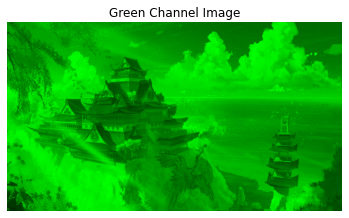

In [6]:
# Green Image Channel

image = cv2.imread(filename)

image_g = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

image_g[:,:,(0,2)]=0 # Setting the other channels as 0 to get green channel image
plt.title('Green Channel Image')
plt.imshow(image_g)
plt.axis('off')
plt.show()

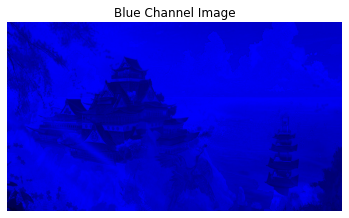

In [7]:
# Blue channel Image
image = cv2.imread(filename)

image_b = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

image_b[:,:,(0,1)] = 0 # Setting the other channels as 0 to get blue channel image
plt.title('Blue Channel Image')
plt.imshow(image_b)
plt.axis('off')
plt.show()

## Resizing the images

In [8]:
# Resizing the image

print('Original Image shape - ',image.shape)

resized_image = cv2.resize(image,(500,750))

print('\nResized Image shape - ',resized_image.shape)

print('\nOriginal Image1 shape - ',image1.shape)

resized_image1 = cv2.resize(image1,(500,750))

print('\nResized Image shape - ',resized_image1.shape)

Original Image shape -  (1080, 1920, 3)

Resized Image shape -  (750, 500, 3)

Original Image1 shape -  (750, 500, 3)

Resized Image shape -  (750, 500, 3)


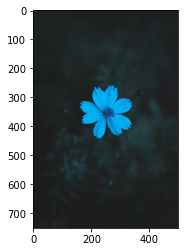

In [9]:
# Plotting the new image

plt.imshow(image1)

plt.show()

## Addition and Subtraction of 2 images

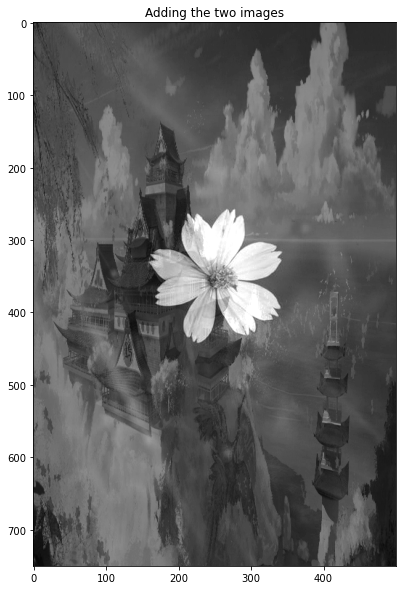

In [10]:
# Adding the 2 images

resized_image = cv2.cvtColor(resized_image,cv2.COLOR_BGR2GRAY)
resized_image1 = cv2.cvtColor(resized_image1,cv2.COLOR_BGR2GRAY)

weightedSum = cv2.addWeighted(resized_image, 0.5, resized_image1, 0.9, 0) # dimensions of the images should be same.
plt.figure(figsize=(10,10))
plt.title('Adding the two images')
plt.imshow(weightedSum,cmap='gray')
plt.show()

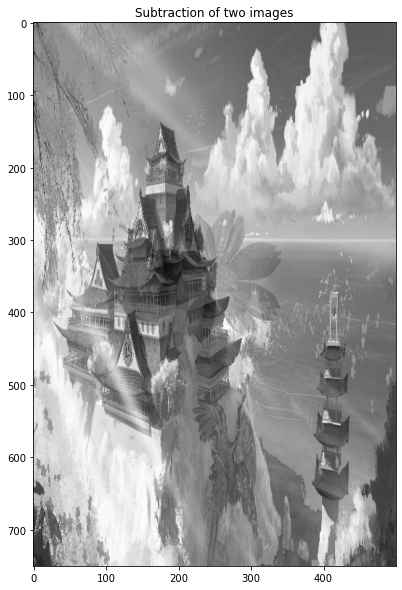

In [11]:
# Subtraction of 2 images
weightedSub = cv2.subtract(weightedSum, resized_image1) # dimensions of the images should be same.
plt.figure(figsize=(10,10))
plt.title('Subtraction of two images')
plt.imshow(weightedSub,cmap='gray')
plt.show()  # We can still see a very lig

## Image Blurring / Filtering


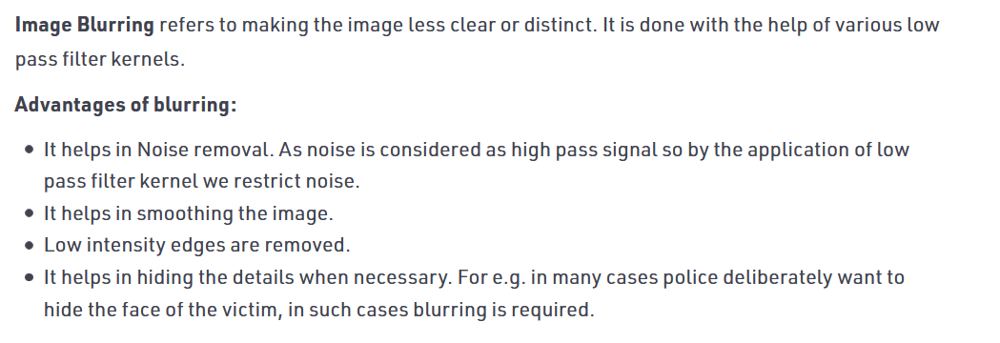

- `Gaussian Blurring`
> - Gaussian blur is the result of blurring an image by a Gaussian function. It is a widely used effect in graphics software, typically to reduce image noise and reduce detail. It is also used as a preprocessing stage before applying our machine learning or deep learning models.

- `Median Blur`
> - The Median Filter is a non-linear digital filtering technique, often used to remove noise from an image or signal. Median filtering is very widely used in digital image processing because, under certain conditions, it preserves edges while removing noise. It is one of the best algorithms to remove Salt and pepper noise.

- `Bilateral Blur` 
> - A bilateral filter is a non-linear, edge-preserving, and noise-reducing smoothing filter for images. It replaces the intensity of each pixel with a weighted average of intensity values from nearby pixels. This weight can be based on a Gaussian distribution. Thus, sharp edges are preserved while discarding the weak ones.

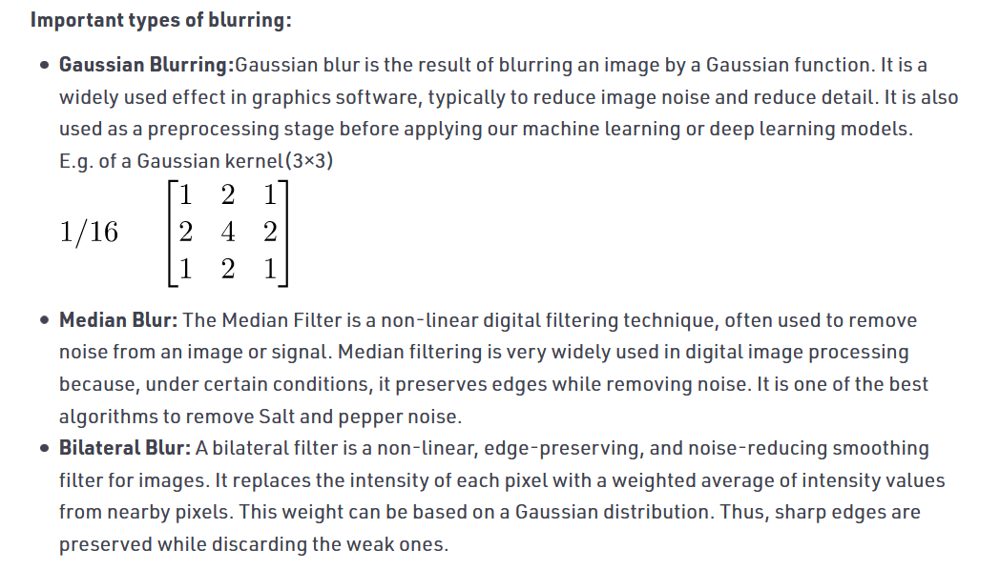

https://medium.com/spinor/a-straightforward-introduction-to-image-blurring-smoothing-using-python-f8870cf1096

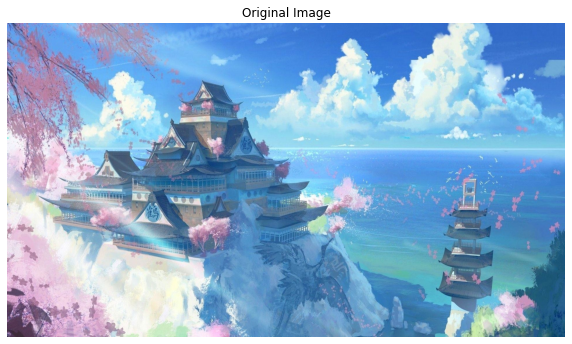

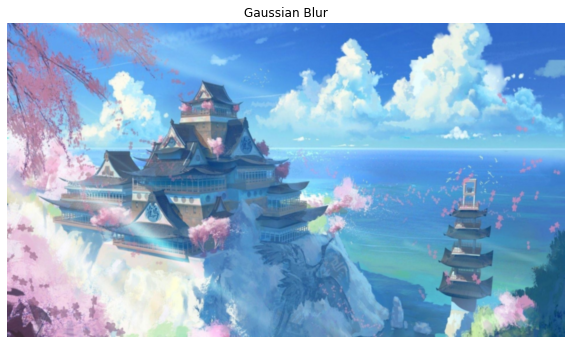

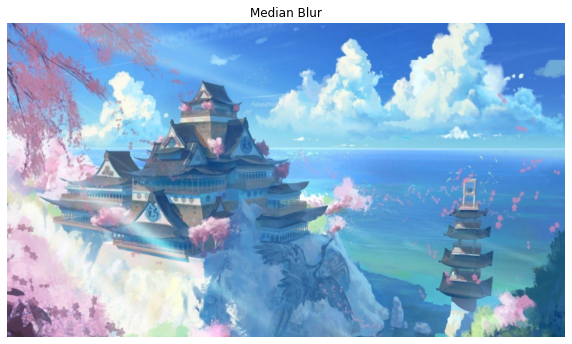

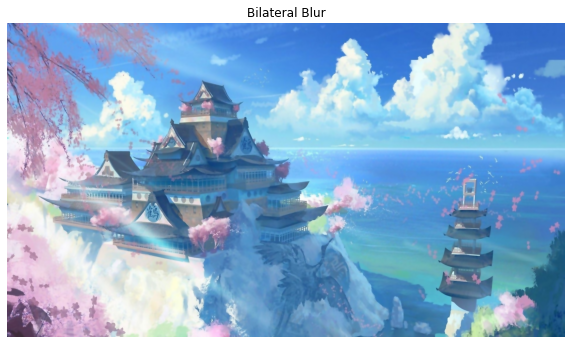

In [12]:
# Original Image
plt.figure(figsize=(10,10))
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')
plt.show()


# Gaussian Blur
plt.figure(figsize=(10,10))
Gaussian = cv2.GaussianBlur(image_rgb, (7, 7), 0) # Gaussian 
plt.title('Gaussian Blur')
plt.imshow(Gaussian)
plt.axis('off')
plt.show()


# Median Blur
plt.figure(figsize=(10,10))
median = cv2.medianBlur(image_rgb, 5) # Median 
plt.imshow(median)
plt.title('Median Blur')
plt.axis('off')
plt.show()

# Bilateral Blur
plt.figure(figsize=(10,10))
bilateral = cv2.bilateralFilter(image_rgb, 9, 75, 75) # Bilateral
plt.imshow(bilateral)
plt.title('Bilateral Blur')
plt.axis('off')
plt.show()

## Image Grayscaling

- Grayscaling is the process of converting an image from other color spaces e.g RGB, CMYK, HSV, etc. to shades of gray. It varies between complete black and complete white.

> Importance of grayscaling –

> 1. Dimension reduction: For e.g. In RGB images there are three color channels and has three dimensions while grayscaled images are single dimensional.
> 2. Reduces model complexity: Consider training neural article on RGB images of 10x10x3 pixel.The input layer will have 300 input nodes. On the other hand, the same neural network will need only 100 input node for grayscaled images.
> 3. For other algorithms to work: There are many algorithms that are customized to work only on grayscaled images e.g. Canny edge detection function pre-implemented in OpenCV library works on Grayscaled images only.

File Name - image.jpg


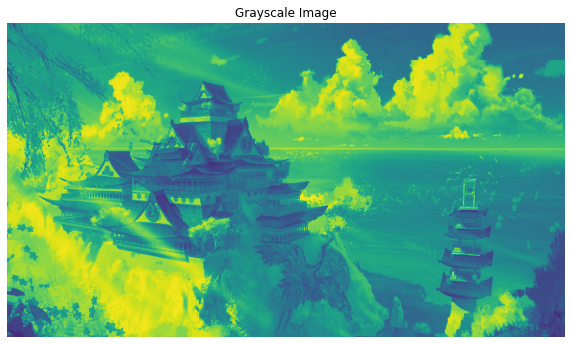

In [14]:
# Reading an image in grayscale format

print('File Name -',filename)

image_grayscale = cv2.imread(filename,0) # set the flag as 0

plt.figure(figsize=(10,10))
plt.title('Grayscale Image')
plt.imshow(image_grayscale)
plt.axis('off')
plt.show()

File Name - image.jpg


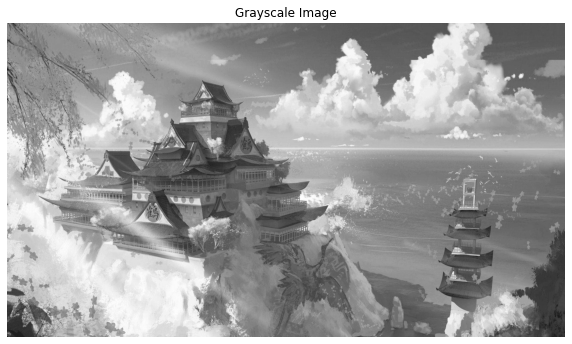

In [15]:
# Reading an image in grayscale format

print('File Name -',filename)

image_grayscale = cv2.imread(filename,0) # set the flag as 0

plt.figure(figsize=(10,10))
plt.title('Grayscale Image')
plt.imshow(image_grayscale,cmap='gray') # In matplotlib it is required to provide cmap as we are plotting on the 2D graph

plt.axis('off')
plt.show()

File Name - image.jpg


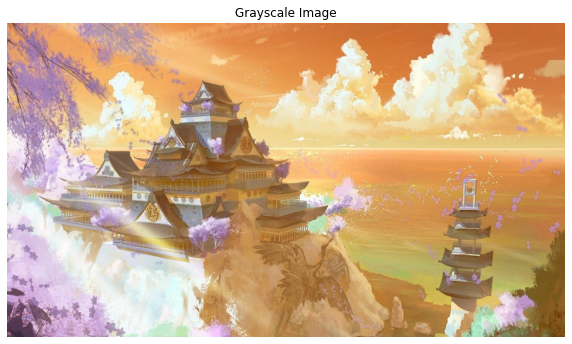

In [16]:
# Reading an image in grayscale format

print('File Name -',filename)

image_grayscale = cv2.imread(filename,1) # set the flag as 0

plt.figure(figsize=(10,10))
plt.title('Grayscale Image')
plt.imshow(image_grayscale,cmap='gray') # In matplotlib it is required to provide cmap as we are plotting on the 2D graph

plt.axis('off')
plt.show()

In [14]:
# Saving the image file 

print('Directory before saving the image')

print('\n',os.listdir()[2:])

cv2.imwrite('Grayscale_image.jpg',image_grayscale) # imwrite function is used to save the image into the directory 

print('\nAfter saving the image')
if 'Grayscale_image.jpg' in os.listdir():
    print('\n FILE IS PRESENT')
else:
    print('NOT PRESENT')

Directory before saving the image

 ['book2.jpg', 'Grayscale_image.jpg', 'image.jpg', 'image1.jpeg', 'image2.png', 'minions.mkv', 'Opencv_tutorial.ipynb', 'sample.png', 'scene.jpg']

After saving the image

 FILE IS PRESENT


## Image thresholding
Thresholding is a technique in OpenCV, which is the assignment of pixel values in relation to the threshold value provided. In thresholding, each pixel value is compared with the threshold value. If the pixel value is smaller than the threshold, it is set to 0, otherwise, it is set to a maximum value (generally 255).


thresholding allows for the isolation of certain objects in an image which can be useful in many applications. Thresholding is only one of the many classical methods of image processing; there is also clustering, edge detection, and region growing just to name a few.


- `cv2.THRESH_BINARY`: If pixel intensity is greater than the set threshold, value set to 255, else set to 0 (black).
- `cv2.THRESH_BINARY_INV`: Inverted or Opposite case of cv2.THRESH_BINARY.
- `cv.THRESH_TRUNC`: If pixel intensity value is greater than threshold, it is truncated to the threshold. The pixel values are set to be the same as the threshold. All other values remain the same.
- `cv.THRESH_TOZERO`: Pixel intensity is set to 0, for all the pixels intensity, less than the threshold value.
- `cv.THRESH_TOZERO_INV`: Inverted or Opposite case of cv2.THRESH_TOZERO.

https://medium.com/@anupriyam/basic-image-thresholding-in-opencv-5af9020f2472

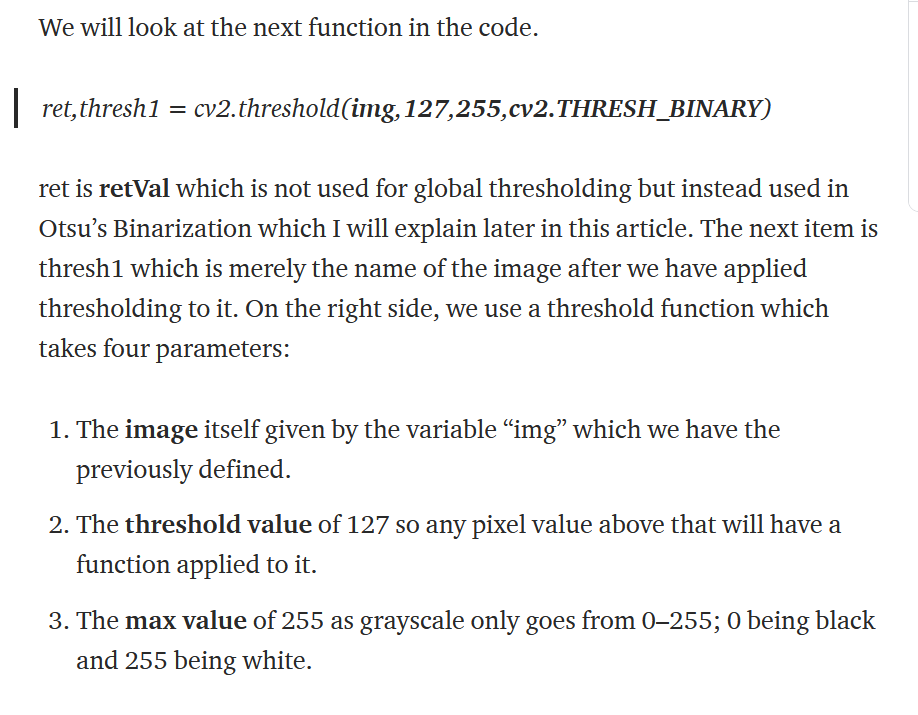

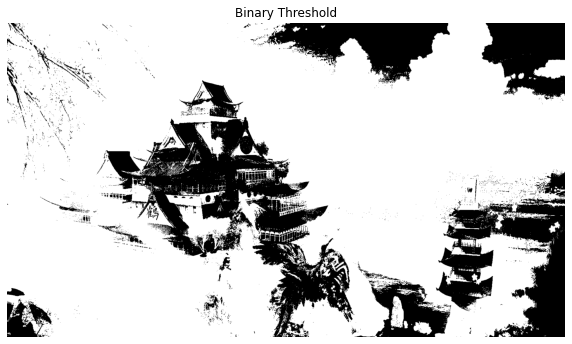

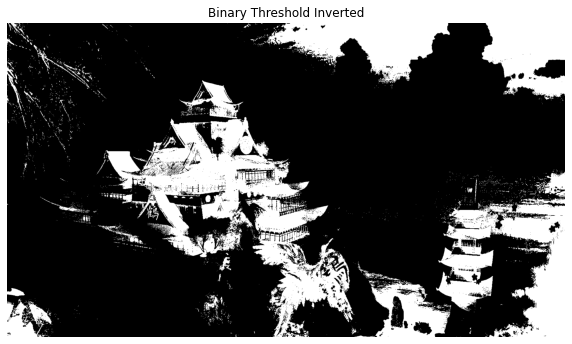

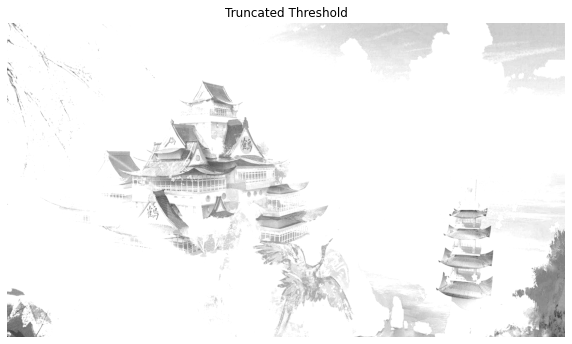

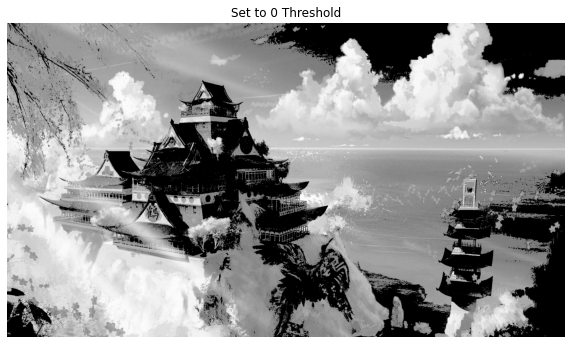

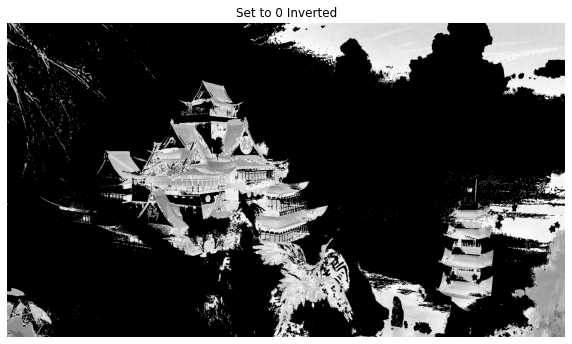

In [15]:
# Reading the image in grayscale format
img_gray = cv2.imread(filename,0) 


# Applying different thresholding techniques



ret, thresh1 = cv2.threshold(img_gray, 120, 255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(img_gray, 120, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(img_gray, 120, 255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(img_gray, 120, 255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(img_gray, 120, 255, cv2.THRESH_TOZERO_INV)

plt.figure(figsize=(10,10))
plt.imshow(thresh1,cmap='gray')
plt.title('Binary Threshold')
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(thresh2,cmap='gray')
plt.title('Binary Threshold Inverted')
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(thresh3,cmap='gray')
plt.title('Truncated Threshold')
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(thresh4,cmap='gray')
plt.title('Set to 0 Threshold')
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(thresh5,cmap='gray')
plt.title('Set to 0 Inverted')
plt.axis('off')
plt.show()

## Image Color space conversion

1. HSV
2. RGB
3. BGR 

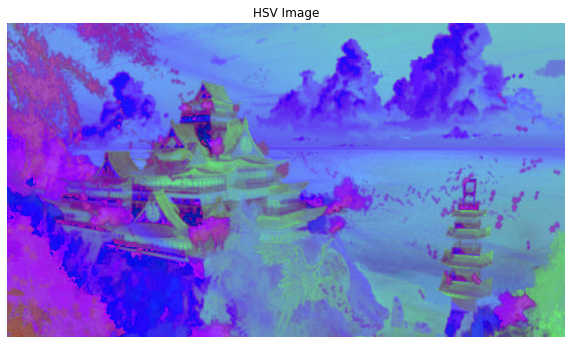

In [16]:
# RGB image to HSV
image_hsv = cv2.cvtColor(image_rgb,cv2.COLOR_RGB2HSV)

plt.figure(figsize=(10,10))
plt.title('HSV Image')
plt.imshow(image_hsv)
plt.axis('off')
plt.show()

## Edge Detection
The process of image detection involves detecting sharp edges in the image.

Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]) -> edges
.   @brief Finds edges in an image using the Canny algorithm @cite Canny86 .
.   
.   The function finds edges in the input image and marks them in the output map edges using the
.   Canny algorithm. The smallest value between threshold1 and threshold2 is used for edge linking. The
.   largest value is used to find initial segments of strong edges. See
.   <http://en.wikipedia.org/wiki/Canny_edge_detector>

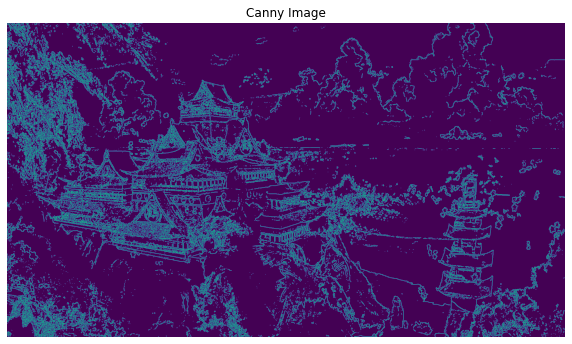

In [17]:
# Edge detection in an Image 

image_canny = cv2.Canny(image_rgb,100,100)  # Canny function can be used. Try giving inputs - 100,500 to see what happens

plt.figure(figsize=(10,10))
plt.title('Canny Image')
plt.imshow(image_canny)
plt.axis('off')
plt.show()

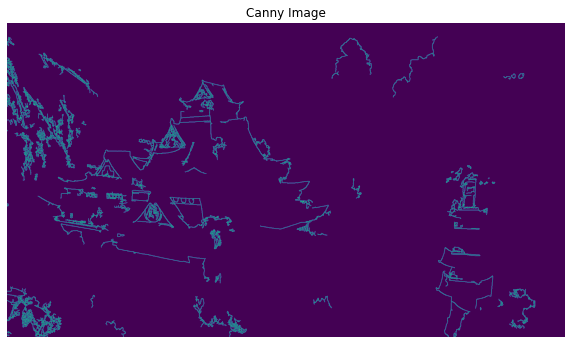

In [18]:
# Edge detection in an Image 

image_canny = cv2.Canny(image_rgb,100,500)  # Canny function can be used. Try giving inputs - 100,500 to see what happens

plt.figure(figsize=(10,10))
plt.title('Canny Image')
plt.imshow(image_canny)
plt.axis('off')
plt.show()

## Denoising of Images

Denoising of an image refers to the process of reconstruction of a signal from noisy images. Denoising is done to remove unwanted noise from image to analyze it in better form. It refers to one of the major pre-processing steps.

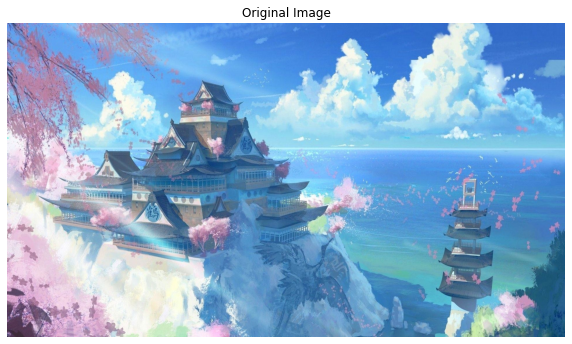

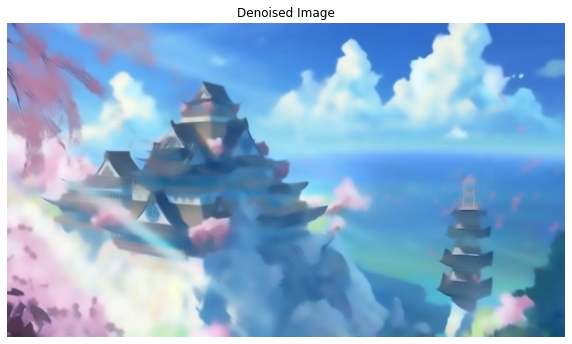

In [18]:
# Reading image from folder where it is stored 
# Denoising of image 
dst = cv2.fastNlMeansDenoisingColored(image_rgb, None, 15, 15, 14, 35)

# Original Image
plt.figure(figsize=(10,10))
plt.title('Original Image')
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

# Denoised image
plt.figure(figsize=(10,10))
plt.title('Denoised Image')
plt.imshow(dst)
plt.axis('off')
plt.show()

## Morphological Transformations

**Erosion** shrinks bright regions and enlarges dark regions. 

**Dilation** on the other hand is exact opposite side - it shrinks dark regions and enlarges the bright regions. 

**Opening** is erosion followed by dilation. Opening can remove small bright spots (i.e. “salt”) and connect small dark cracks. This tends to “open” up (dark) gaps between (bright) features.

**Closing** is dilation followed by erosion. Closing can remove small dark spots (i.e. “pepper”) and connect small bright cracks. This tends to “close” up (dark) gaps between (bright) features.

All these can be done using the `skimage.morphology` module or the other way is to directly use the cv2 library but skimage is better 

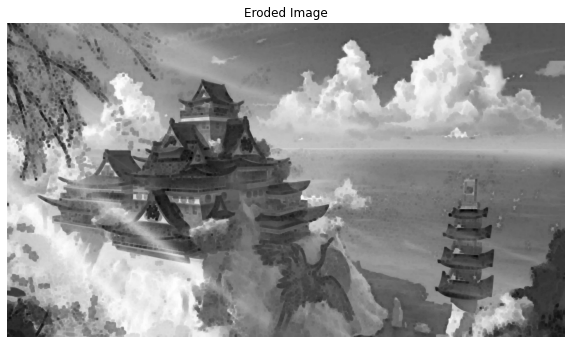

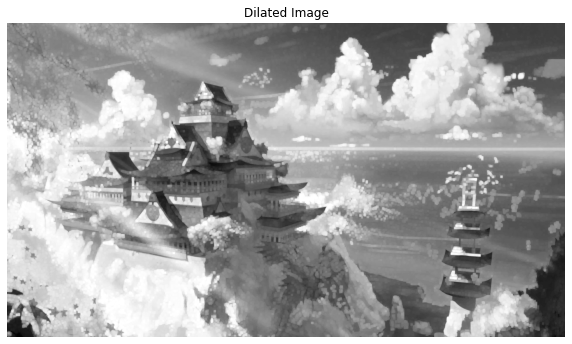

In [19]:
# Creating kernel
kernel = np.ones((7,7), np.uint8)

# Eroded Image
plt.figure(figsize=(10,10))
eroded_image  = cv2.erode(image_grayscale,kernel)
plt.imshow(eroded_image,cmap='gray')
plt.title('Eroded Image')
plt.axis('off')
plt.show()


# Dilated Image
plt.figure(figsize=(10,10))
eroded_image  = cv2.dilate(image_grayscale,kernel)
plt.imshow(eroded_image,cmap='gray')
plt.title('Dilated Image')
plt.axis('off')
plt.show()


## Alternate way for morpholigical operations using skimage library

In [20]:
# Function to plot images 
def plot_image(images,cmap=None,caption=None):
    
    f,ax = plt.subplots(1,len(images),sharey=True)
    f.set_figwidth(20)
    f.suptitle(caption,fontsize=20)
    for ax1,im in zip(ax,images):
                    ax1.imshow(im,cmap=cmap)
                    ax1.axis('off')
    plt.show()

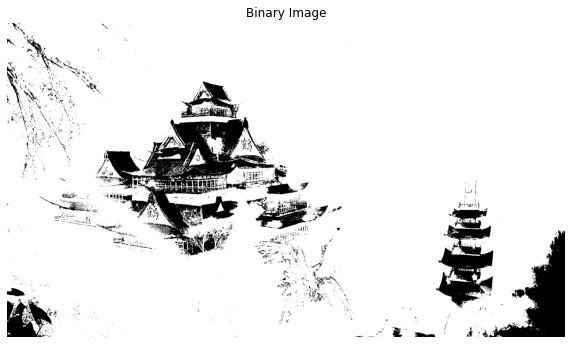

In [21]:
# Creating the binary image using threshold method

bin_image = image_rgb[:,:,2]>150

plt.figure(figsize=(10,10))
plt.imshow(bin_image,cmap='gray')
plt.title('Binary Image')
plt.axis('off')
plt.show()

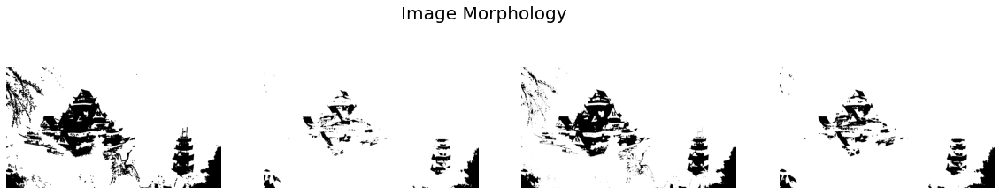

In [22]:
from skimage.morphology import binary_erosion,binary_dilation,binary_closing,binary_opening,selem
selem = selem.disk(3)

# Open operation
open_img = binary_opening(bin_image,selem)

# Close operation
close_img = binary_closing(bin_image,selem)

# Eroded operation
eroded_img = binary_erosion(bin_image,selem)

# Dilated operation
dilated_img = binary_dilation(bin_image,selem)

# Plot the images
plot_image([eroded_img,dilated_img,open_img,close_img],caption='Image Morphology',cmap='gray')

## Image Augmentations

1. Linear Transformations
2. Affine Transformations

In [23]:
# Loading the skimage methods
from skimage.morphology import binary_erosion,binary_dilation,binary_closing,binary_opening,selem
from skimage import transform

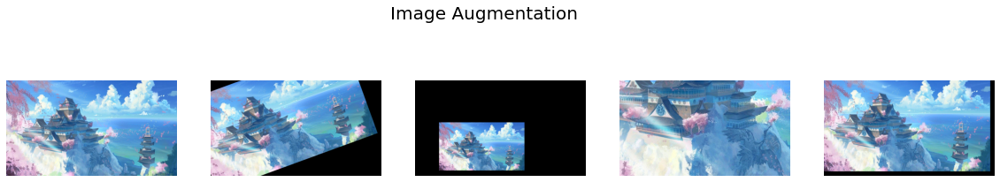

In [24]:
# specify x and y coordinates to be used for shifting (mid points)
shift_x, shift_y = image_rgb.shape[0]/2, image_rgb.shape[1]/2

# translation by certain units
matrix_to_topleft = transform.SimilarityTransform(translation=[-shift_x, -shift_y])
matrix_to_center = transform.SimilarityTransform(translation=[shift_x, shift_y])

# rotation
rot_transforms =  transform.AffineTransform(rotation=np.deg2rad(20))
rot_matrix = matrix_to_topleft + rot_transforms + matrix_to_center
rot_image = transform.warp(image_rgb, rot_matrix)

# scaling 
scale_transforms = transform.AffineTransform(scale=(2, 2))
scale_matrix = matrix_to_topleft + scale_transforms + matrix_to_center
scale_image_zoom_out = transform.warp(image_rgb, scale_matrix)

scale_transforms = transform.AffineTransform(scale=(0.5, 0.5))
scale_matrix = matrix_to_topleft + scale_transforms + matrix_to_center
scale_image_zoom_in = transform.warp(image_rgb, scale_matrix)

# translation
transaltion_transforms = transform.AffineTransform(translation=(50, 50))
translated_image = transform.warp(image_rgb, transaltion_transforms)


plot_image([image_rgb, rot_image, scale_image_zoom_out, scale_image_zoom_in, translated_image],caption ='Image Augmentation')

# USE CASE
## Image Segmentation

- Image segmentation is a processing technique where one can extract particular objects from the image.

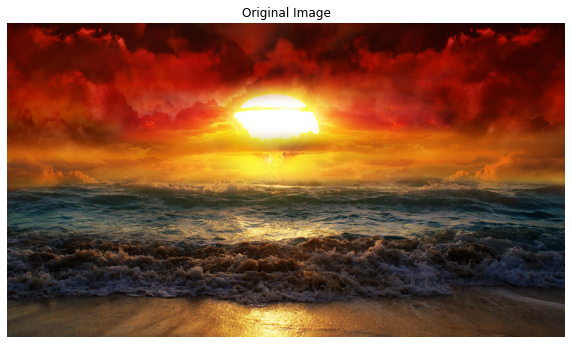

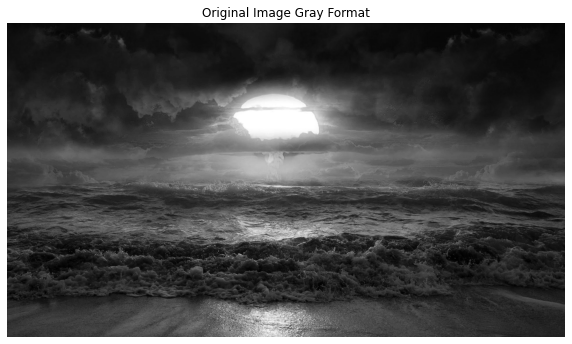

In [25]:
# Getting the new image
filename3 = 'scene.jpg'

scene = cv2.imread(filename3)

image_scene = cv2.cvtColor(scene,cv2.COLOR_BGR2RGB)

image_scene_gray =  cv2.cvtColor(image_scene,cv2.COLOR_BGR2GRAY)


plt.figure(figsize=(10,10))
plt.title('Original Image')
plt.imshow(image_scene)
plt.axis('off')
plt.show()


plt.figure(figsize=(10,10))
plt.title('Original Image Gray Format')
plt.imshow(image_scene_gray,cmap='gray')
plt.axis('off')
plt.show()

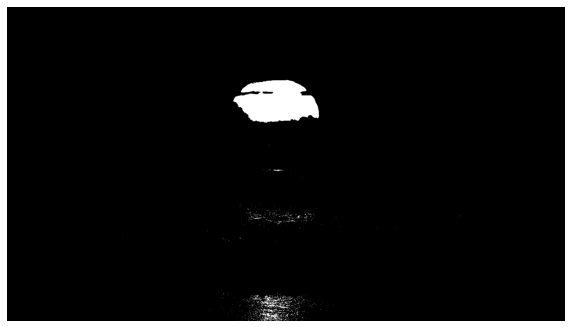

In [26]:
# Getting the threshold image
res,thresh  = cv2.threshold(image_scene_gray,220,255,cv2.THRESH_BINARY)
plt.figure(figsize=(10,10))
plt.imshow(thresh,cmap='gray')
plt.axis('off')
plt.show()

https://medium.com/srm-mic/color-segmentation-using-opencv-93efa7ac93e2

In [20]:
cv2.dilate?

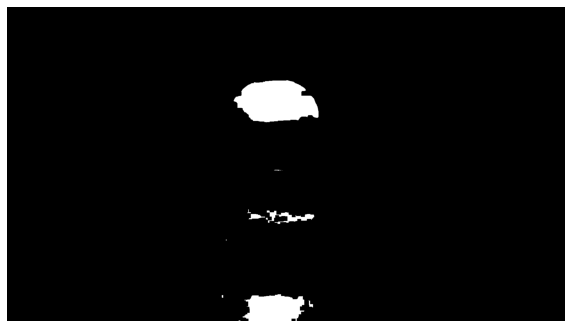

In [27]:
# Image Segmentation
kernel = np.ones((3,3),np.uint8)


# Dilation for backgrounds
bg = cv2.dilate(thresh, kernel, iterations = 0)

# Closing operation 
closing = cv2.morphologyEx(bg,cv2.MORPH_CLOSE,kernel,iterations = 5)

# Distance Transformation
dist_transform = cv2.distanceTransform(closing, cv2.DIST_L2, 0)

ret, fg = cv2.threshold(dist_transform, 0.02*dist_transform.max(), 255, 0)

plt.figure(figsize=(10,10))
plt.imshow(fg,cmap='gray')
plt.axis('off')
plt.show()

## Image Registration
- It is a digital image processing technique that aligns different images of the same scene. For example, one may click the picture from various angles. It gives the diversity of camera angle.


> **Applications**

> - 1. Stiching of video scenes.
> - 2. Aligning documental images.
> - 3. Aligning medical images for better observation and analysis.

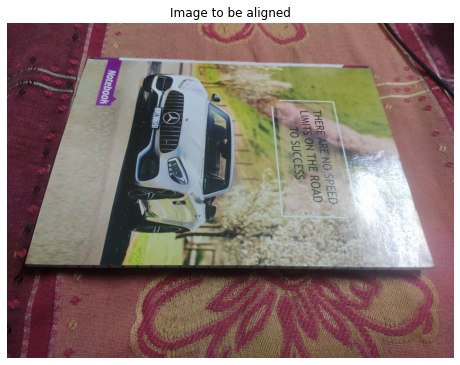

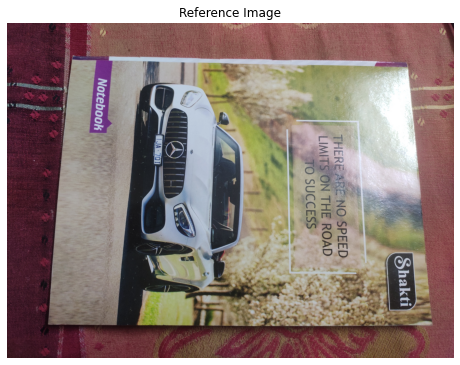

In [28]:
# Loading the images
book1 = cv2.cvtColor(cv2.imread('book1.jpg'),cv2.COLOR_BGR2RGB) # Image to be aligned
book2 = cv2.cvtColor(cv2.imread('book2.jpg'),cv2.COLOR_BGR2RGB) # Reference image

plt.figure(figsize=(8,8))
plt.imshow(book1)
plt.title('Image to be aligned')
plt.axis('off')
plt.show()

plt.figure(figsize=(8,8))
plt.imshow(book2)
plt.title('Reference Image')
plt.axis('off')
plt.show()

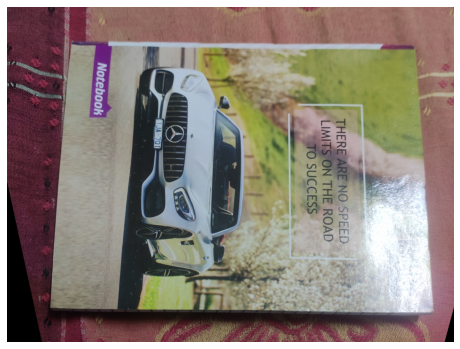

In [29]:
# Convert images to grayscale.
img2 = cv2.cvtColor(book2, cv2.COLOR_BGR2GRAY)
img1 = cv2.cvtColor(book1, cv2.COLOR_BGR2GRAY)
height, width = img2.shape
  
# Create ORB detector with 7000 features.
orb_detector = cv2.ORB_create(7000)
  
# Find keypoints and descriptors. The first arg is the image, second arg is the mask which is setted as None.
kp1, d1 = orb_detector.detectAndCompute(img1, None)
kp2, d2 = orb_detector.detectAndCompute(img2, None)
  
# Match features between the two images.
# Hamming distance as measurement mode.
matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
  
# Match the two sets of descriptors.
matches = matcher.match(d1, d2)
  
# Sort matches on the basis of their Hamming distance.
matches.sort(key = lambda x: x.distance)
  
# Take the top 90 % matches forward.
matches = matches[:int(len(matches)*90)]
no_of_matches = len(matches)
  
# Define empty matrices of shape no_of_matches * 2.
p1 = np.zeros((no_of_matches, 2))
p2 = np.zeros((no_of_matches, 2))
  
for i in range(len(matches)):
    p1[i, :] = kp1[matches[i].queryIdx].pt
    p2[i, :] = kp2[matches[i].trainIdx].pt
    
    
# Find the homography matrix.
homography, mask = cv2.findHomography(p1, p2, cv2.RANSAC)
  
# Use this matrix to transform the colored image wrt the reference image.
transformed_img = cv2.warpPerspective(book1,
                    homography, (width, height))

plt.figure(figsize=(8,8))
plt.imshow(transformed_img)

plt.axis('off')
plt.show()

## Intensity Transformation Operations on Images

- It is used for contrast operations over the image data

> **Log Transformation**
> - The transformation can be expressed as `s = c*log(1+r)`. Here, s is the output intensity, r>=0 is the input intensity of the pixel, and c is a scaling constant. c is given by 255/(log (1 + m)), where m is the maximum pixel value in the image.

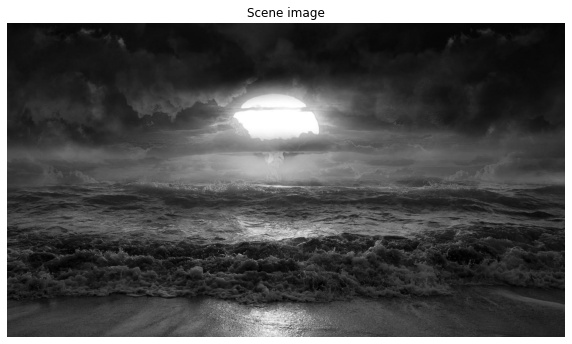

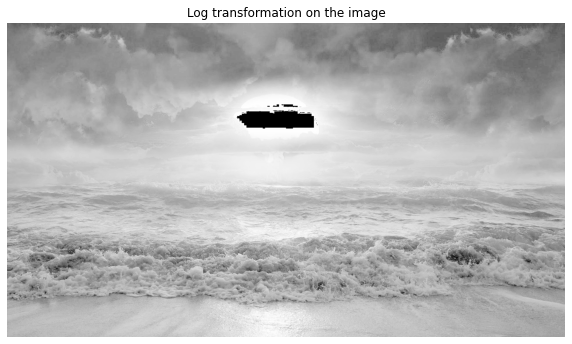

In [30]:
# Apply log transform.
c = 255/(np.log(1 + np.max(image_scene_gray)))
log_transformed = c * np.log(1 + image_scene_gray)
  
# Specify the data type.
log_transformed = np.array(log_transformed, dtype = np.uint8)

plt.figure(figsize=(10,10))
plt.title('Scene image')
plt.imshow(image_scene_gray,cmap='gray')
plt.axis('off')
plt.show()

plt.figure(figsize=(10,10))
plt.title('Log transformation on the image')
plt.imshow(log_transformed,cmap='gray')
plt.axis('off')
plt.show()


> **Power-Law (Gamma) Transformation –**
> - Gamma correction is important for displaying images on a screen correctly, to prevent bleaching or darkening of images when viewed from different types of monitors with different display settings. This is done because our eyes perceive images in a gamma-shaped curve, whereas cameras capture images in a linear fashion. Formula -  `s = c*r^y`, where y is gamma.

> - If value of gamma is `less than 1`, the image becomes `lighter`. On the other hand, if the value of gamma if `more than 1` then  `darkening` can be seen.

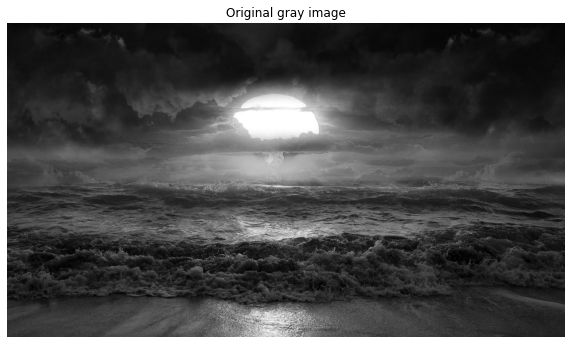

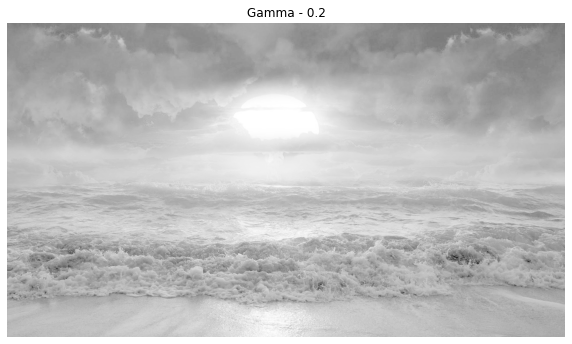

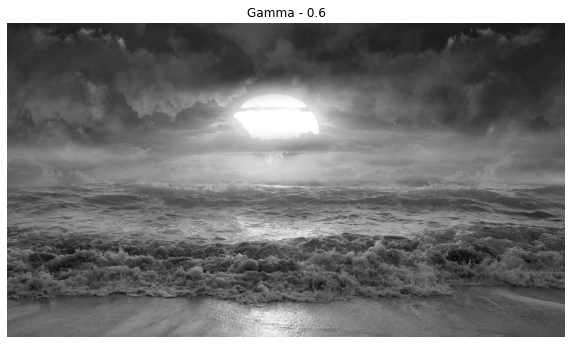

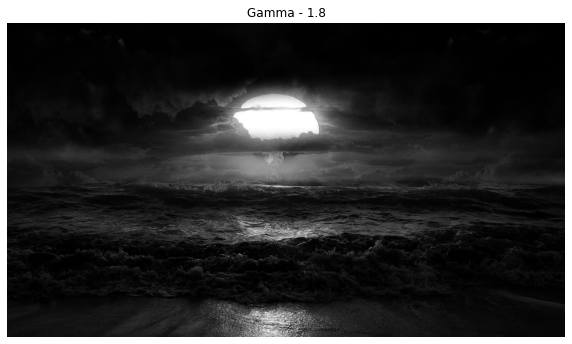

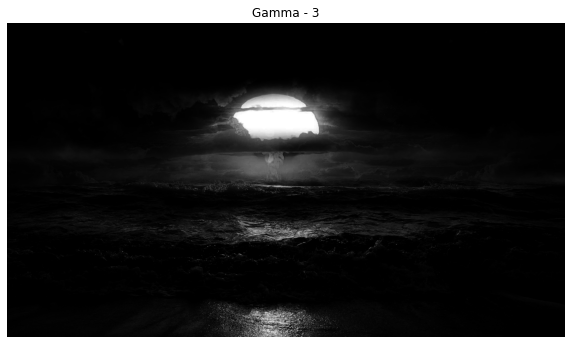

In [31]:
# Original Image
plt.figure(figsize=(10,10))
plt.title('Original gray image')
plt.imshow(image_scene_gray ,cmap='gray')
plt.axis('off')
plt.show()


# Trying 4 gamma values.
for gamma in [0.2, 0.6, 1.8, 3]:
      
    # Apply gamma correction.
    gamma_corrected = np.array(255*(image_scene_gray / 255) ** gamma, dtype = 'uint8')
    plt.figure(figsize=(10,10))
    plt.imshow(gamma_corrected,cmap='gray')
    plt.title(f'Gamma - {gamma}')
    plt.axis('off')
    plt.show()

## Draw Functions

### 1. Drawing Lines in an image

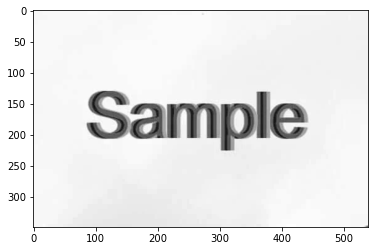

In [32]:
# Getting an image

filename = 'sample.png'

image_sample = cv2.imread(filename) 

image_sample_gray = cv2.cvtColor(image_sample,cv2.COLOR_BGR2GRAY)

plt.imshow(image_sample_gray,cmap='gray')
plt.show()

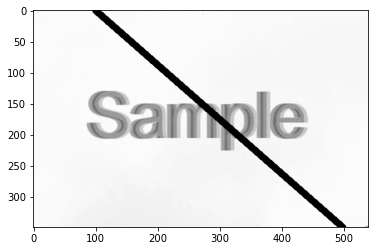

In [33]:
# Start coordinate, here (225, 0)
# represents the top right corner of image
start_point = (100, 0)
  
# End coordinate, here (0, 225)
# represents the bottom left corner of image
end_point = (500, 350)
  
# Black color in BGR
color = (0, 0, 0)
  
# Line thickness of 5 px
thickness = 10
  
# Using cv2.line() method
# Draw a diagonal black line with thickness of 5 px
image = cv2.line(image_sample_gray, start_point, end_point, color, thickness)

plt.imshow(image,cmap='gray')
plt.show()

### 2. Draw ArrowedLines

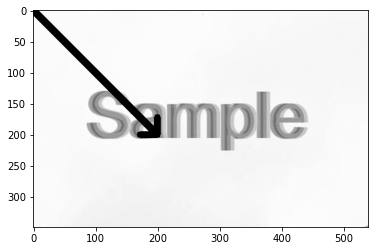

In [34]:

image_sample_gray = cv2.cvtColor(image_sample,cv2.COLOR_BGR2GRAY)

# Start coordinate, here (0, 0) 
# represents the top left corner of image 
start_point = (0, 0) 
  
# End coordinate
end_point = (200, 200) 
  
# Green color in BGR 
color = (0, 255, 0) 
  
# Line thickness of 9 px 
thickness = 9
  
# Using cv2.arrowedLine() method 
# Draw a diagonal green arrow line
# with thickness of 9 px 
image = cv2.arrowedLine(image_sample_gray, start_point, end_point,
                                     color, thickness) 

plt.imshow(image,cmap='gray')
plt.show()

### 3. Circle Detection

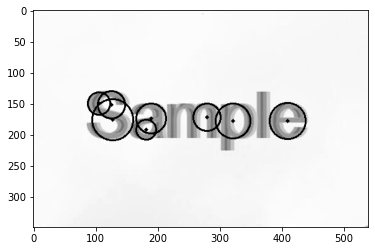

In [35]:

# Cnverting the image to grayscale
image_sample_gray = cv2.cvtColor(image_sample,cv2.COLOR_BGR2GRAY)
gray_blurred = cv2.blur(image_sample_gray, (3, 3))

# Apply Hough transform on the blurred image.
detected_circles = cv2.HoughCircles(gray_blurred, 
                   cv2.HOUGH_GRADIENT, 1, 20, param1 = 50,
               param2 = 30, minRadius = 1, maxRadius = 40)
  
# Draw circles that are detected.
if detected_circles is not None:
  
    # Convert the circle parameters a, b and r to integers.
    detected_circles = np.uint16(np.around(detected_circles))
  
    for pt in detected_circles[0, :]:
        a, b, r = pt[0], pt[1], pt[2]
  
        # Draw the circumference of the circle.
        cv2.circle(image_sample_gray, (a, b), r, (0, 255, 0), 2)
  
        # Draw a small circle (of radius 1) to show the center.
        cv2.circle(image_sample_gray, (a, b), 1, (0, 0, 255), 3)
        plt.imshow(image_sample_gray,cmap='gray')

## Video Processing

> - cv2.VideoCapture(0):    Means first camera or webcam.
> - cv2.VideoCapture(1):    Means second camera or webcam.
> - cv2.VideoCapture("file name.mp4"):  Means video file.

### Extracting the frames out of the video

In [36]:
# Creating frames from the video

cam = cv2.VideoCapture('minions.mkv')
  
try:
      
    # creating a folder path
    if not os.path.exists('frames_directory'):
        os.makedirs('frames_directory')
        
        
except OSError:
    print ('Error: Creating directory of data')
    
# initial frame
currentframe = 0
  
while(True):
      
    ret,frame = cam.read()
  
    if ret:
        # if video is still left continue creating images
        name = './frames_directory/frame' + str(currentframe) + '.jpg'
        print ('Creating...' + name)
  
        # writing the extracted images
        cv2.imwrite(name, frame)
  
        # increasing counter to show frame count
        currentframe += 1
        
        if currentframe==500:
            break
    else:
        break
        
# Release all space and windows once done
cam.release()
cv2.destroyAllWindows()

Creating..../frames_directory/frame0.jpg
Creating..../frames_directory/frame1.jpg
Creating..../frames_directory/frame2.jpg
Creating..../frames_directory/frame3.jpg
Creating..../frames_directory/frame4.jpg
Creating..../frames_directory/frame5.jpg
Creating..../frames_directory/frame6.jpg
Creating..../frames_directory/frame7.jpg
Creating..../frames_directory/frame8.jpg
Creating..../frames_directory/frame9.jpg
Creating..../frames_directory/frame10.jpg
Creating..../frames_directory/frame11.jpg
Creating..../frames_directory/frame12.jpg
Creating..../frames_directory/frame13.jpg
Creating..../frames_directory/frame14.jpg
Creating..../frames_directory/frame15.jpg
Creating..../frames_directory/frame16.jpg
Creating..../frames_directory/frame17.jpg
Creating..../frames_directory/frame18.jpg
Creating..../frames_directory/frame19.jpg
Creating..../frames_directory/frame20.jpg
Creating..../frames_directory/frame21.jpg
Creating..../frames_directory/frame22.jpg
Creating..../frames_directory/frame23.jpg
Cr

Creating..../frames_directory/frame202.jpg
Creating..../frames_directory/frame203.jpg
Creating..../frames_directory/frame204.jpg
Creating..../frames_directory/frame205.jpg
Creating..../frames_directory/frame206.jpg
Creating..../frames_directory/frame207.jpg
Creating..../frames_directory/frame208.jpg
Creating..../frames_directory/frame209.jpg
Creating..../frames_directory/frame210.jpg
Creating..../frames_directory/frame211.jpg
Creating..../frames_directory/frame212.jpg
Creating..../frames_directory/frame213.jpg
Creating..../frames_directory/frame214.jpg
Creating..../frames_directory/frame215.jpg
Creating..../frames_directory/frame216.jpg
Creating..../frames_directory/frame217.jpg
Creating..../frames_directory/frame218.jpg
Creating..../frames_directory/frame219.jpg
Creating..../frames_directory/frame220.jpg
Creating..../frames_directory/frame221.jpg
Creating..../frames_directory/frame222.jpg
Creating..../frames_directory/frame223.jpg
Creating..../frames_directory/frame224.jpg
Creating...

Creating..../frames_directory/frame404.jpg
Creating..../frames_directory/frame405.jpg
Creating..../frames_directory/frame406.jpg
Creating..../frames_directory/frame407.jpg
Creating..../frames_directory/frame408.jpg
Creating..../frames_directory/frame409.jpg
Creating..../frames_directory/frame410.jpg
Creating..../frames_directory/frame411.jpg
Creating..../frames_directory/frame412.jpg
Creating..../frames_directory/frame413.jpg
Creating..../frames_directory/frame414.jpg
Creating..../frames_directory/frame415.jpg
Creating..../frames_directory/frame416.jpg
Creating..../frames_directory/frame417.jpg
Creating..../frames_directory/frame418.jpg
Creating..../frames_directory/frame419.jpg
Creating..../frames_directory/frame420.jpg
Creating..../frames_directory/frame421.jpg
Creating..../frames_directory/frame422.jpg
Creating..../frames_directory/frame423.jpg
Creating..../frames_directory/frame424.jpg
Creating..../frames_directory/frame425.jpg
Creating..../frames_directory/frame426.jpg
Creating...